In [1]:
%matplotlib notebook

#from ipywidgets import *
import os, sys, glob, time
from collections import defaultdict
from copy import copy
import numpy as np
import h5py
import pickle as pl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy import signal
from scipy.sparse import csr_matrix
from scipy.special import legendre, eval_legendre
from scipy.ndimage import gaussian_filter, gaussian_filter1d
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

sys.path.append("/reg/neh/home5/khegazy/baseTools/UEDanalysis/modules")
sys.path.append("/reg/neh/home5/khegazy/baseTools/modules")
sys.path.append("../../")
from data_handling import *
from fitting import *
from data_retrieval import *
from parameters import get_parameters

In [2]:
run = "fullRevival"
params = get_parameters(run)

q = np.arange(params.NradAzmBins)*params.QperPix


rad_inds = get_pixel_shells(params.NradAzmBins+1)
scans, images, nanMaps, stage_pos, image_nums, image_norms,\
centers, center_stdRs, isRefs = get_images(
        params.molName, run, scans=None, skip=[171,321], form=params.data_format)

# Adding Scan 171 with a different number of images
scans_171, images_171, nanMaps_171, stage_pos_171, image_nums_171,\
image_norms_171, centers_171, center_stdRs_171, isRefs_171 = get_images(
        params.molName, params.run, scans=171, form=params.data_format)




Scans:  [211 221 231 232 233 234 311 312 313 314 331 332 333 334]
Getting Images
Getting nanMaps
Getting stage positions
Getting image number
Getting image normalization
Getting image centers
Getting image centers
Getting image reference indicator
Scans:  [171]
Getting Images
Getting nanMaps
Getting stage positions
Getting image number
Getting image normalization
Getting image centers
Getting image centers
Getting image reference indicator


In [5]:
fName = os.path.join(params.simOutputDir, "{0}_sim_diffraction-azmAvg_align-random_Qmax-{1:.4g}.h5".format(
        params.molName, params.QperPix*(params.NradAzmBins-1)))
with h5py.File(fName, 'r') as hf:
    atm_scattering = hf["atm_diffraction"][:]
    mol_scattering = hf["mol_diffraction"][:]
    sms_scattering = hf["sms_diffraction"][:]

# Reference Image

In [6]:
ref_scans, ref_images, ref_nanMaps, ref_stage_pos, ref_image_nums,\
ref_image_norms, ref_centers, ref_center_stdRs, ref_isRefs = get_images(params.molName, params.run, scans=321)

# Reshape [NtimeSteps, image_rows, image_cols]
ref_images = np.reshape(ref_images, (-1, ref_images.shape[-2], ref_images.shape[-1]))
ref_nanMaps = np.reshape(ref_nanMaps, (-1, ref_nanMaps.shape[-2], ref_nanMaps.shape[-1]))
ref_centers = np.reshape(ref_centers, (-1, ref_centers.shape[-1]))

Scans:  [321]
Getting Images
Getting nanMaps
Getting stage positions
Getting image number
Getting image normalization
Getting image centers
Getting image centers
Getting image reference indicator


In [7]:
ref_radial_pixels = []
ref_radial_stds   = []
ref_radial_nanMap = []
for rad in range(params.NradAzmBins):
    img_inds, row_inds, col_inds = [], [], []
    for im in range(ref_images.shape[0]):
        img_inds.append(np.ones(rad_inds[rad][0].shape[0], dtype=int)*im)
        row_inds.append(rad_inds[rad][0]+ref_centers[im,0])
        col_inds.append(rad_inds[rad][1]+ref_centers[im,1])
    img_inds = np.concatenate(img_inds)
    row_inds = np.concatenate(row_inds)
    col_inds = np.concatenate(col_inds)
    radial_pixels = np.reshape(ref_images[img_inds,row_inds,col_inds], (ref_images.shape[0], -1))
    radial_nanMap = np.reshape(ref_nanMaps[img_inds,row_inds,col_inds], (ref_images.shape[0], -1))
    
    #SETUP CLEANING
    
    radial_pixels[radial_nanMap.astype(bool)] = np.nan
    radial_stds = np.zeros_like(radial_pixels)
    radial_stds[radial_nanMap.astype(bool)] = np.nan
    radial_stds = np.nanstd(radial_pixels, 0)
    radial_pixels = np.nanmean(radial_pixels, 0)
    radial_pixels[np.all(radial_nanMap.astype(bool), axis=0)] = 0
    
    radial_stds[np.all(radial_nanMap.astype(bool), axis=0)] = 0
    if np.any(np.isnan(radial_pixels)):
        print("ERROR: DO NOT EXPECT ANY NANS!!!")
    ref_radial_pixels.append(radial_pixels)
    ref_radial_stds.append(radial_stds)
    ref_radial_nanMap.append(np.all(radial_nanMap.astype(bool), axis=0))

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: Mean of empty slice


# Merge Scans

In [6]:
fName = os.path.join(params.preProcOutputDir, "Run-"+params.run, "Scan_t0Shifts.pl")
with open(fName, "rb") as file:
    shift_dict = pl.load(file)

In [7]:
def merge_data(images, nanMaps, centers, std_cut, maxPixel,
    rad_inds, ref_rad_pixs=None, ref_rad_nans=None, loop_sem_cut=1):
    # Must have dimension order [NtimeSteps, Nscans, Nrows, Ncols]
    # By specifying ref_rad_pixels it will subtract the reference
    #for rad in rads | Could make a radial loop if needed in the future
    
    merged_centerR = maxPixel - 1
    merged_centerC = maxPixel - 1
    merged_image = np.ones((len(images), 2*maxPixel-1, 2*maxPixel-1))*np.nan
    merged_image_sem = np.ones_like(merged_image)*np.nan
    merged_image_counts = np.ones_like(merged_image)*np.nan
    for rad in range(maxPixel):
        pixels, nans, angles = [], [], []
        angles = np.arctan2(rad_inds[rad][1], rad_inds[rad][0])
        
        for itm in range(len(images)):
            scn_inds, row_inds, col_inds = [], [], []
            for isc in range(images[itm].shape[0]):
                scn_inds.append(np.ones(rad_inds[rad][0].shape[0], dtype=int)*isc)
                row_inds.append(rad_inds[rad][0]+centers[itm][isc,0])
                col_inds.append(rad_inds[rad][1]+centers[itm][isc,1])
            scn_inds = np.concatenate(scn_inds)
            row_inds = np.concatenate(row_inds)
            col_inds = np.concatenate(col_inds)
            img_pixels = np.reshape(copy(images[itm][scn_inds,row_inds,col_inds]), (images[itm].shape[0], -1))
            img_nans   = np.reshape(copy(nanMaps[itm][scn_inds,row_inds,col_inds]), (images[itm].shape[0], -1))
            
            if ref_rad_pixs is not None:
                img_pixels -= ref_rad_pixs[rad]
                img_nans   = (img_nans + np.expand_dims(ref_rad_nans[rad], 0)).astype(bool)
                images[itm][scn_inds,row_inds,col_inds] -= np.tile(ref_rad_pixs[rad], images[itm].shape[0])
            
            
            mask = np.ones_like(img_pixels)
            mask[img_nans.astype(bool)] = np.nan
            for istd in range(loop_sem_cut):
              mean = np.nanmean(img_pixels*mask, axis=0)
              std  = np.nanstd(img_pixels*mask, axis=0)
              std[std==0.0] = np.sqrt(np.abs(mean[std==0.0]))
          
              # Cut pixels 
              mask[np.abs(mean-img_pixels) > std_cut*std] = np.nan
              img_nans[np.abs(mean-img_pixels) > std_cut*std] = 1
                
            
            # Merge
            merged_img_pixels = np.nanmean(img_pixels*mask, axis=0)
            merged_img_sem    = np.nanstd(img_pixels*mask, axis=0)
            merged_img_counts = np.nansum(mask, axis=0)
            merged_img_sem    /= np.sqrt(merged_img_counts)
            merged_img_sem[np.isnan(merged_img_sem)] = 0
            
            nanMaps[itm][scn_inds,row_inds,col_inds] = img_nans.flatten()
            merged_image[itm,merged_centerR+rad_inds[rad][0],merged_centerC+rad_inds[rad][1]] = copy(merged_img_pixels[:])
            merged_image_sem[itm,merged_centerR+rad_inds[rad][0],merged_centerC+rad_inds[rad][1]] = copy(merged_img_sem[:])
            merged_image_counts[itm,merged_centerR+rad_inds[rad][0],merged_centerC+rad_inds[rad][1]] = copy(merged_img_counts[:])
        
    
    return merged_image, merged_image_sem, merged_image_counts, nanMaps, images


In [8]:
min_shift = np.amin(np.array(shift_dict.values()))
max_shift = np.amin(np.array(shift_dict.values()))
images_align_dict = defaultdict(list)
nanMap_align_dict = defaultdict(list)
center_align_dict = defaultdict(list)

# Aligning by t0 shifts
for isc, sc in enumerate(scans):
    shift = shift_dict[sc]
    for i in range(images.shape[0]):
        if sc == 171:
            if i >= images_171.shape[0]:
                continue
            images_align_dict[shift+i].append(images_171[i,isc])
            nanMap_align_dict[shift+i].append(nanMaps_171[i,isc])
            center_align_dict[shift+i].append(centers_171[i,isc,:])
        else:
            images_align_dict[shift+i].append(images[i,isc])
            nanMap_align_dict[shift+i].append(nanMaps[i,isc])
            center_align_dict[shift+i].append(centers[i,isc,:])


# Combining
images_align_input = []
nanMap_align_input = []
center_align = []
print(np.array(list(images_align_dict.keys())))
for k in np.sort(np.array(list(images_align_dict.keys()))):
    images_align_input.append(np.array(images_align_dict[k]))
    nanMap_align_input.append(np.array(nanMap_align_dict[k]))
    center_align.append(np.array(center_align_dict[k]))

# Merge and Remove 3std outliers and merge
merged_images, merged_images_sem, merged_images_count, nanMap_align, images_align = merge_data(
        images_align_input, nanMap_align_input, center_align, 2.5, params.NradAzmBins, rad_inds,
        ref_rad_pixs=ref_radial_pixels, ref_rad_nans=ref_radial_nanMap, loop_sem_cut=3)
merged_centers = np.array([[merged_images.shape[-2]//2, merged_images.shape[-1]//2]]*merged_images.shape[0])

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37  0 -1 38]


/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:47: RuntimeWarning: Mean of empty slice


In [9]:
# Saving
save_images_align, save_nanMaps_align, save_centers_align = [], [], []
maxSize = max([images_align[i].shape[0] for i in range(len(images_align))])
for i in range(len(images_align)):
    shape = images_align[i].shape
    if shape[0] < maxSize:
        save_images_align.append(np.concatenate([images_align[i], np.ones((maxSize-shape[0], shape[1], shape[2]))*np.nan]))
        save_nanMaps_align.append(np.concatenate([nanMap_align[i], np.ones((maxSize-shape[0], shape[1], shape[2]))*np.nan]))
        save_centers_align.append(np.concatenate([center_align[i], np.zeros((maxSize-shape[0],
                center_align[i].shape[1]))]))
    else:
        save_images_align.append(images_align[i])
        save_nanMaps_align.append(nanMap_align[i])
        save_centers_align.append(center_align[i])
save_images_align = np.array(save_images_align)
save_nanMaps_align = np.array(save_nanMaps_align)
save_centers_align = np.array(save_centers_align)

fName = os.path.join(params.mergeScansOutputDir, 'images_aligned.h5')
with h5py.File(fName, 'w') as file:
    file.create_dataset('images_align',  data=save_images_align)
    file.create_dataset('nanMaps_align', data=save_nanMaps_align)
    file.create_dataset('centers_align', data=save_centers_align)
    file.create_dataset('q', data=q)

MemoryError: Unable to allocate 4.38 GiB for an array with shape (40, 14, 1024, 1024) and data type float64

# Cut Determination

## Image Norm

(37, 14) (37, 14) (37, 14)


<IPython.core.display.Javascript object>


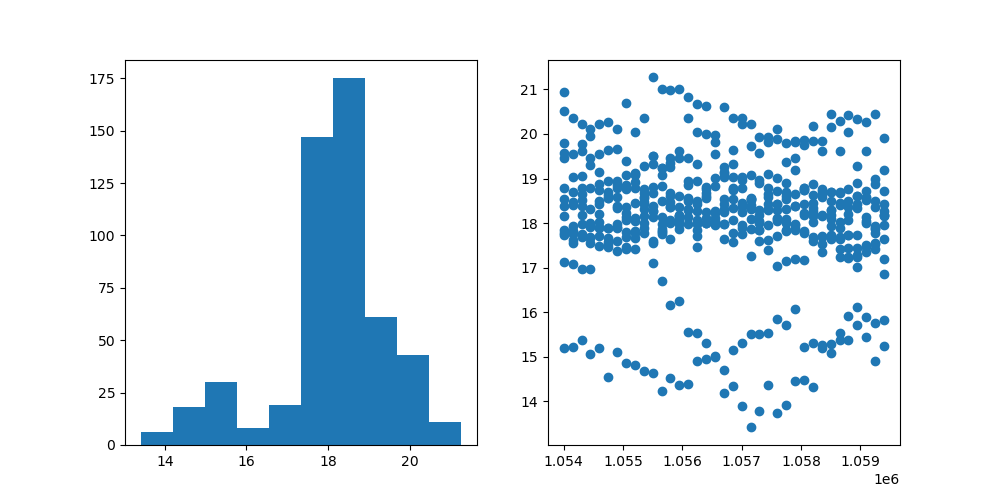

<IPython.core.display.Javascript object>


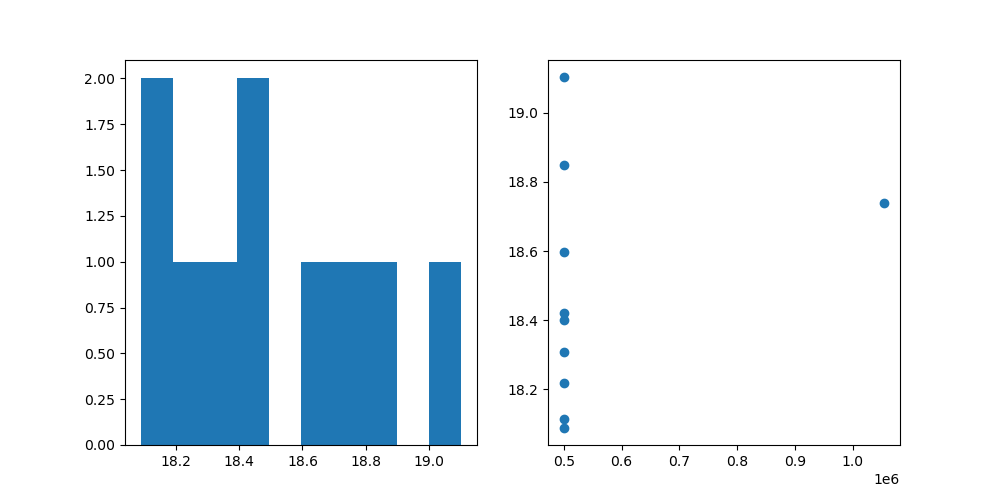

In [9]:
print(stage_pos.shape, image_norms.shape, image_nums.shape)
fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].hist(image_norms.flatten())
ax[1].scatter(stage_pos.flatten(), image_norms.flatten())
fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].hist(ref_image_norms.flatten())
ax[1].scatter(ref_stage_pos.flatten(), ref_image_norms.flatten())

# Keep > 16.5

## center std

(10, 1, 2)


<IPython.core.display.Javascript object>


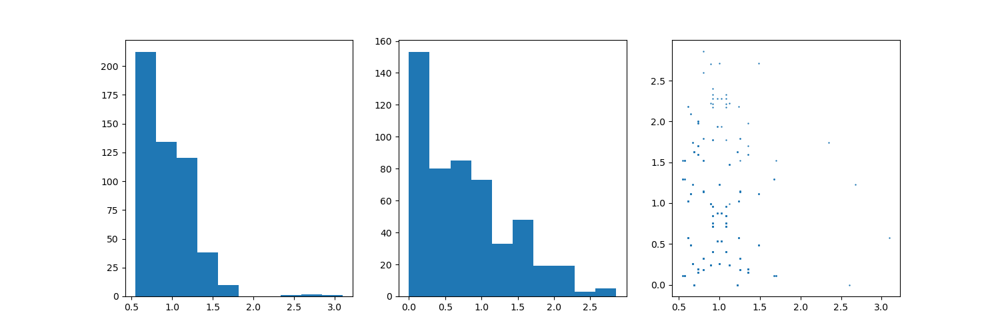

<IPython.core.display.Javascript object>


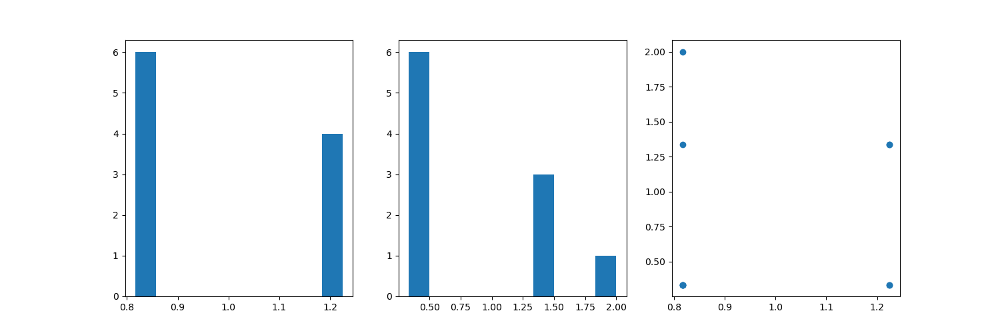

In [11]:
print(ref_center_stdRs.shape)
fig,ax = plt.subplots(1,3,figsize=(15,5))
ax[0].hist(center_stdRs[:,:,0].flatten())
ax[1].hist(center_stdRs[:,:,1].flatten())                        
ax[2].scatter(center_stdRs[:,:,0].flatten(), center_stdRs[:,:,1].flatten(), s=0.5)
#ax[2].set_xlim([-0.05,0.3])
#ax[2].set_ylim([-0.05,0.3])
fig,ax = plt.subplots(1,3,figsize=(15,5))
ax[0].hist(ref_center_stdRs[:,:,0].flatten())
ax[1].hist(ref_center_stdRs[:,:,1].flatten())                        
ax[2].scatter(ref_center_stdRs[:,:,0].flatten(), ref_center_stdRs[:,:,1].flatten())
#ax[2].set_xlim([0,1])
#ax[2].set_ylim([0,1])

# Keep < 5

In [13]:
print(np.argmin(np.abs(q-4)))

116


## Looking at q defects

(40, 14, 375, 6) (40, 375, 6) (40, 375, 6)
(4, 375, 1)


<IPython.core.display.Javascript object>


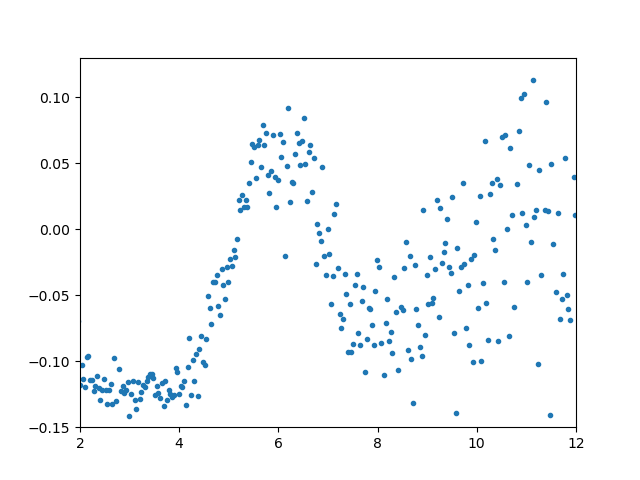

min -0.0013100050628392728 -0.020370593492795935 178 6.130466214285715


In [13]:
# Get Legendre fit
fName = os.path.join(params.mergeScansOutputDir, 'legendre_coeffs.h5')
with h5py.File(fName, 'r') as file:
    #q = file['q'][:]
    all_lgFits = file['image_coeffs'][:]
    merged_lgFits = np.transpose(file['coefficients'][:], (2,1,0))
    merged_lgFits_sem = np.transpose(file['sem'][:], (2,1,0))
print(all_lgFits.shape, merged_lgFits.shape, merged_lgFits.shape)

# Get Timebasis fit
folder = "/reg/ued/ana/scratch/N2O/timeBases/"
fName_results = os.path.join(folder,
    "UED_fit_results_Temp-30.0-150.0-121_Ints-1.0-10.0-91.h5")
with h5py.File(fName_results, "r") as h5:
    fit_coeffs = h5["fit_coeffs"][:]
    fit_coeffs_var = h5["fit_coeffs_cov"][:]
    legendre_inds = h5["legendre_inds"][:]
    #q = h5["fit_axis"][:]*self.qScale
print(fit_coeffs.shape)
plt.figure()
plt.plot(q, fit_coeffs[1,:,0]/atm_scattering, '.')
plt.xlim([2,12])
plt.ylim([-0.15,0.13])

# Find minimum outlier
minVal, minInd = np.inf, 0
for iq,qq in enumerate(q):
    if qq < 5.7 or qq > 6.67:
        continue
    if (fit_coeffs[1,:,0]/atm_scattering)[iq] < minVal:
        minVal = (fit_coeffs[1,:,0]/atm_scattering)[iq]
        minInd = iq
print("min", fit_coeffs[0,minInd,0]/atm_scattering[minInd], minVal, minInd, q[minInd])
    

In [14]:
def get_rad_pix(images, centers, rad_inds, maxPixel, image_nanMaps, rad_range):
    rad_pixels = []
    rad_angles = []
    for rad in range(maxPixel):
        if rad < rad_range[0] or rad >= rad_range[1]:
            continue

        pixels, nans, angles = [], [], []
        angles = np.arctan2(rad_inds[rad][1].astype(float), rad_inds[rad][0].astype(float))
        rad_angles.append(copy(angles))

        rad_pixels.append([])
        for im in range(len(images)):

            scn_inds, row_inds, col_inds = [], [], []
            for isc in range(images[im].shape[0]):
                scn_inds.append(np.ones(rad_inds[rad][0].shape[0], dtype=int)*isc)
                row_inds.append(rad_inds[rad][0]+centers[im][isc,0])
                col_inds.append(rad_inds[rad][1]+centers[im][isc,1])
                    
            scn_inds = np.concatenate(scn_inds)
            row_inds = np.concatenate(row_inds)
            col_inds = np.concatenate(col_inds)
            rad_pixels[-1].append(np.reshape(copy(images[im][scn_inds,row_inds,col_inds]), (images[im].shape[0], -1)))
            #img_counts = np.reshape(copy(image_counts[im][scn_inds,row_inds,col_inds]), (images[im].shape[0], -1))
            #img_stds = np.reshape(copy(image_stds[im][scn_inds,row_inds,col_inds]), (images[im].shape[0], -1))
            rad_pixels[-1][-1][np.reshape(image_nanMaps[im][scn_inds,row_inds,col_inds], (images[im].shape[0], -1)).astype(bool)] = np.nan
            #img_counts[np.reshape(image_nanMaps[im][scn_inds,row_inds,col_inds], (images[im].shape[0], -1)).astype(bool)] = 0
    return rad_pixels, rad_angles

## 3.6 - 4.4

<IPython.core.display.Javascript object>


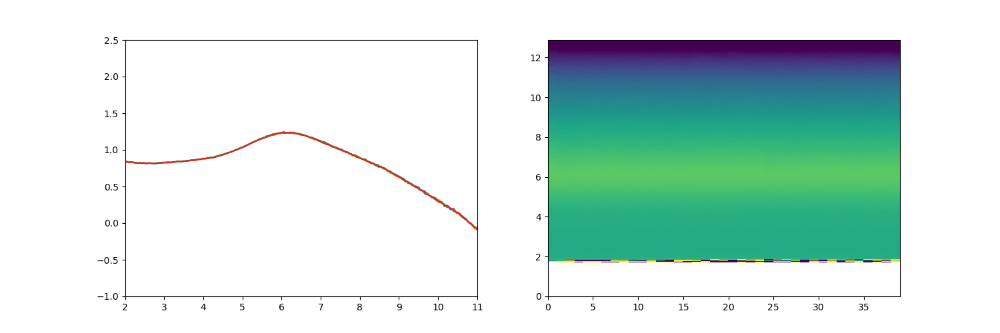

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:9: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


<IPython.core.display.Javascript object>


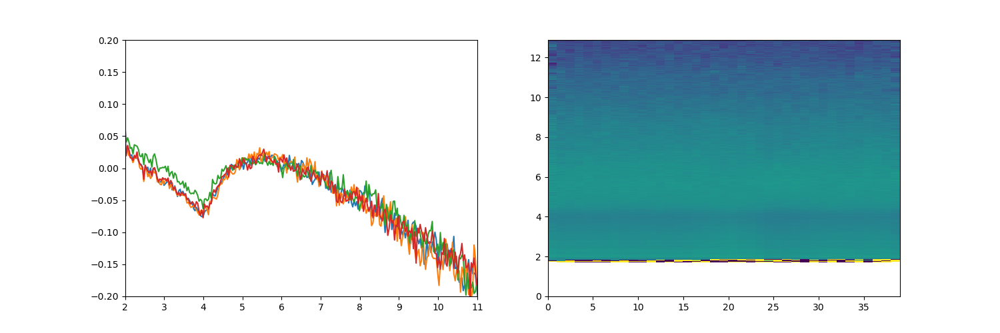

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:17: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


<IPython.core.display.Javascript object>


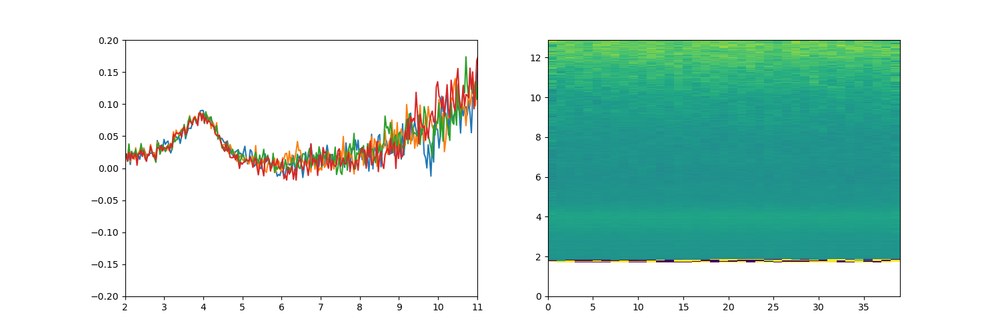

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:24: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


<IPython.core.display.Javascript object>


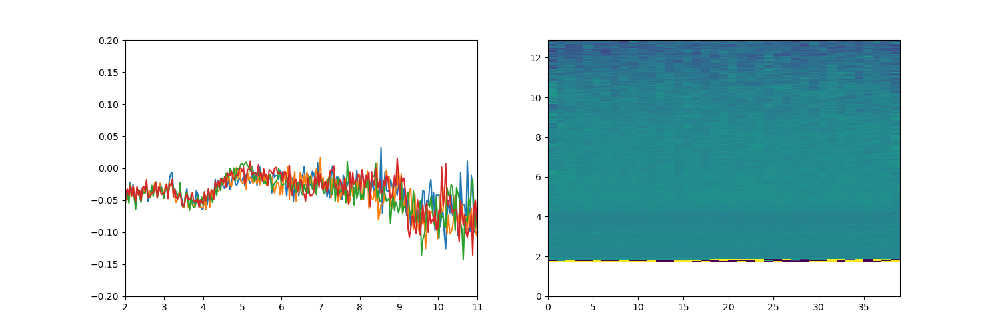

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:31: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


In [14]:
pinds = [5,10,20,32]
X,Y = np.meshgrid(np.arange(merged_lgFits.shape[0]), q)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_lgFits[i,:,0]/atm_scattering)
ax[0].set_ylim([-1, 2.5])
ax[0].set_xlim([2,11])
time.sleep(0.1)
ax[1].pcolormesh(X, Y, np.transpose(merged_lgFits[:,:,0]/atm_scattering), vmin=-1, vmax=2)
time.sleep(0.1)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_lgFits[i,:,1]/atm_scattering)
ax[0].set_ylim([-0.2, 0.2])
ax[0].set_xlim([2,11])
time.sleep(0.1)
ax[1].pcolormesh(X,Y,np.transpose(merged_lgFits[:,:,1]/atm_scattering), vmin=-0.5, vmax=0.5)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_lgFits[i,:,2]/atm_scattering)
ax[0].set_ylim([-0.2, 0.2])
ax[0].set_xlim([2,11])
time.sleep(0.1)
ax[1].pcolormesh(X,Y,np.transpose(merged_lgFits[:,:,2]/atm_scattering), vmin=-0.5, vmax=0.5)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_lgFits[i,:,3]/atm_scattering)
ax[0].set_ylim([-0.2, 0.2])
ax[0].set_xlim([2,11])
time.sleep(0.1)
ax[1].pcolormesh(X,Y,np.transpose(merged_lgFits[:,:,3]/atm_scattering), vmin=-0.5, vmax=0.5)

<IPython.core.display.Javascript object>


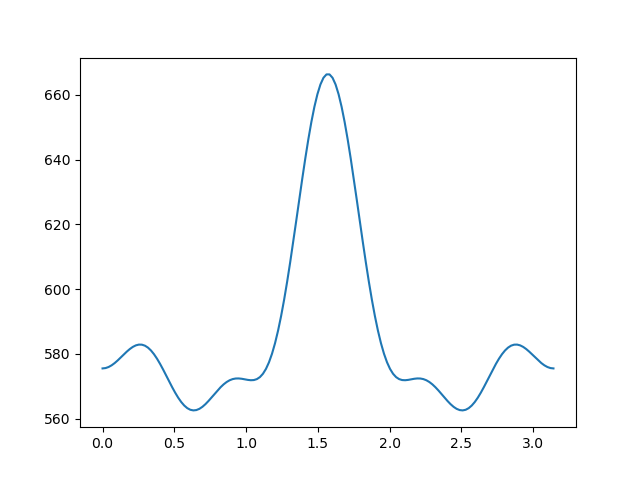

In [37]:
ang = np.linspace(0, np.pi, 150)
art = np.zeros_like(ang)
for i,lg in enumerate(np.arange(6)*2):
    art += merged_lgFits[i,115,i]*legendre(lg)(np.cos(ang))
plt.figure()
plt.plot(ang, art)

In [44]:
print(np.argmin(np.abs(q-3.6)), np.argmin(np.abs(q-4.4)))
print((2.35+0.8)/2)
print(np.cos(2.35))

105 128
1.5750000000000002
-0.702713076773554


23 40 (2, 664)
23 (664,)


<IPython.core.display.Javascript object>


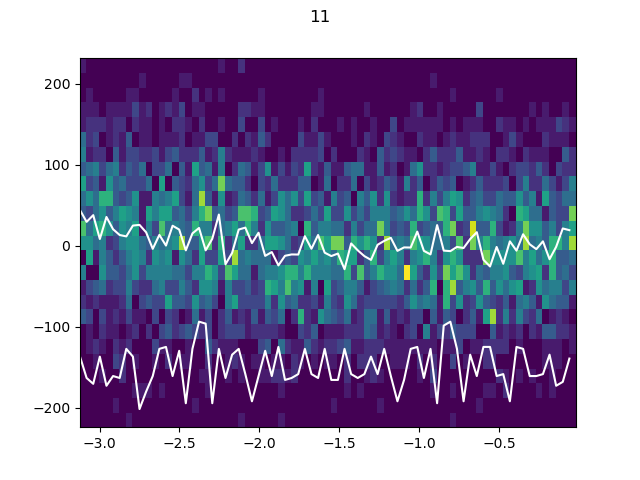

(26, 76) (26, 76) (75, 25)


SystemExit: 0

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3425: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [50]:
pixels, angles = get_rad_pix(images_align, center_align, rad_inds, params.NradAzmBins, nanMap_align, [105, 128])
print(len(pixels), len(pixels[0]), pixels[0][0].shape)
print(len(angles), angles[0].shape)
for itm in range(len(pixels[0])):
    if itm < 11 or itm > 29:
        continue
    
    fig, ax = plt.subplots()
    #ax.hist2d()
    fig.suptitle(str(itm))
    ang = np.array([angles[0] for x in range(pixels[0][itm].shape[0])]).flatten()
    pix = pixels[0][itm].flatten()
    mask = np.invert(np.isnan(pix))
    vals, x, y = np.histogram2d(ang[mask], pixels[0][itm].flatten()[mask], (75, 25))
    X, Y = np.meshgrid(x,y)
    print(X.shape, Y.shape, vals.shape)
    ax.pcolormesh(X,Y,np.transpose(vals))
    mn = np.mean(vals, axis=1)*60
    ax.plot(x[:-1], mn - np.mean(mn)-150, '-w')
    mn = np.sum(vals*np.expand_dims(y[1:]+y[:-1], 0)/2, axis=1)/np.sum(vals, axis=1)
    ax.plot(x[:-1], mn, '-w')
    #ax.hist2d(ang[mask], pixels[0][itm].flatten()[mask], (75, 25))
    sys.exit(0)
    plt.figure()
    plt.plot(vals[:,0])
    print("mean", np.mean(vals[:,0]))
    #print(ang.shape, pixels[0][itm].flatten().shape)
    #ax.plot(ang, pixels[0][itm].flatten(), '.')
    time.sleep(0.2)

(40, 14, 375, 6) (40, 375, 6)


<IPython.core.display.Javascript object>


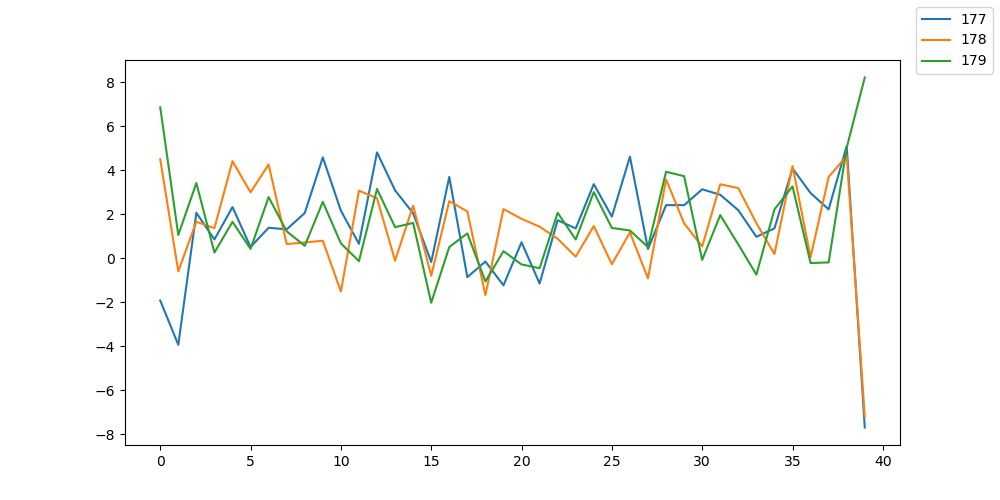

In [65]:
rad = 179
print(all_lgFits.shape, merged_lgFits.shape)
lgFits = all_lgFits[:,:,rad,1]
fig,ax = plt.subplots(figsize=(10,5))
for i,sh in enumerate(np.arange(3)-2):
    ax.plot(merged_lgFits[:,rad+sh,1], label=str(rad+sh))
fig.legend()
#plt.plot(np.nanmean(lgFits, axis=1))
#plt.figure()
#plt.plot(merged_lgFits[:,rad,1])


1 40 (2, 1152)
1 (1152,)


<IPython.core.display.Javascript object>


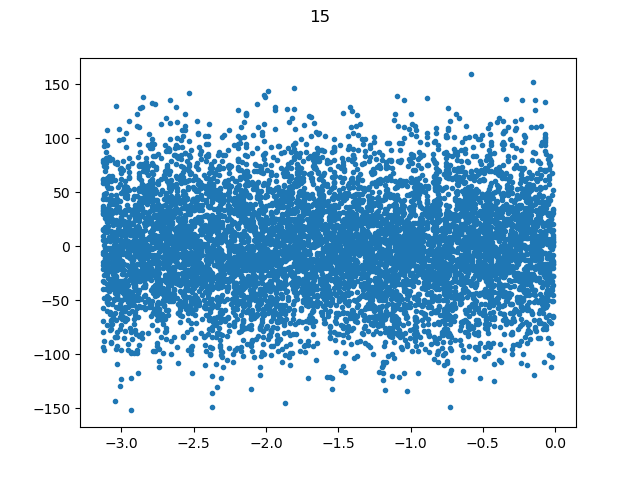

(16128,) (16128,)


<IPython.core.display.Javascript object>


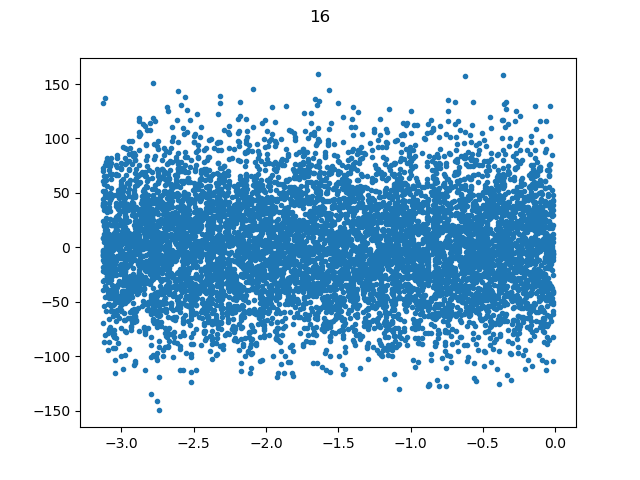

(16128,) (16128,)


<IPython.core.display.Javascript object>


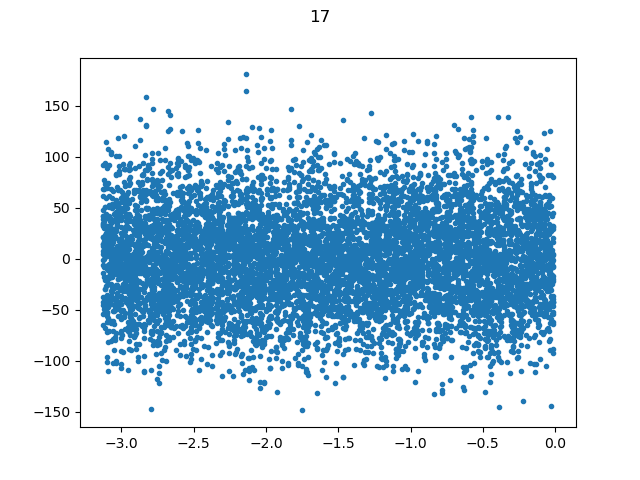

(16128,) (16128,)


<IPython.core.display.Javascript object>


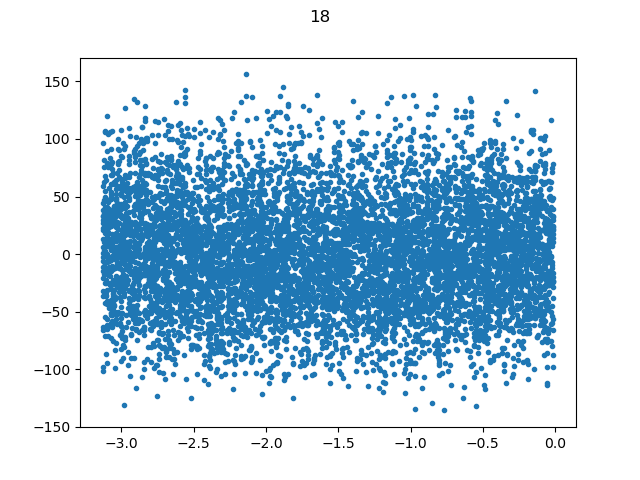

(16128,) (16128,)


<IPython.core.display.Javascript object>


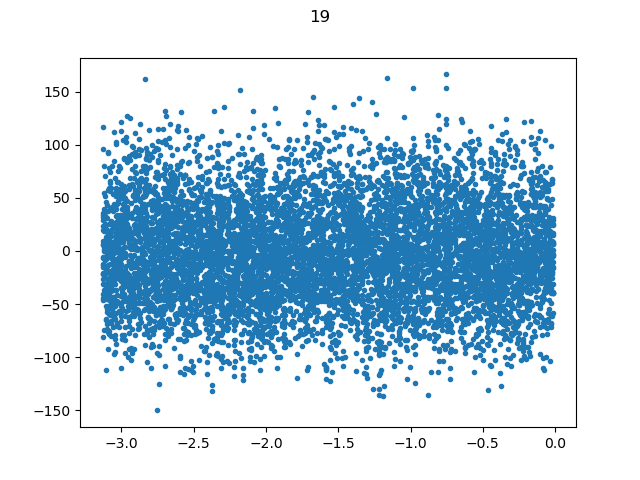

(16128,) (16128,)


<IPython.core.display.Javascript object>


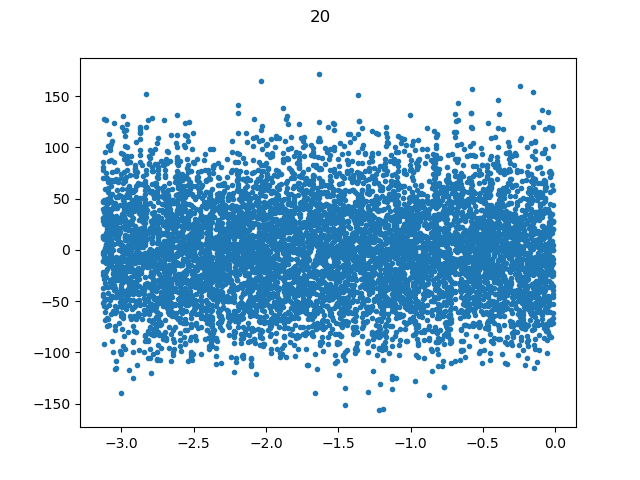

(16128,) (16128,)


<IPython.core.display.Javascript object>


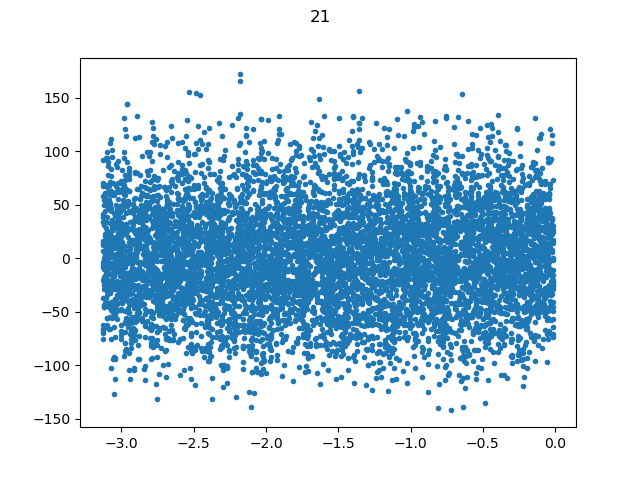

(16128,) (16128,)


<IPython.core.display.Javascript object>


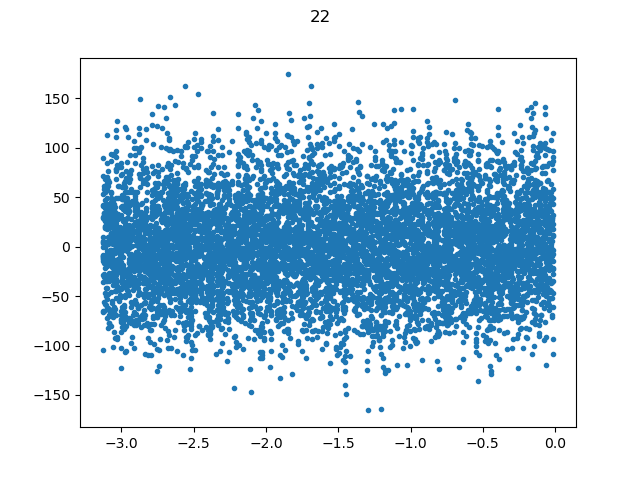

(16128,) (16128,)


<IPython.core.display.Javascript object>


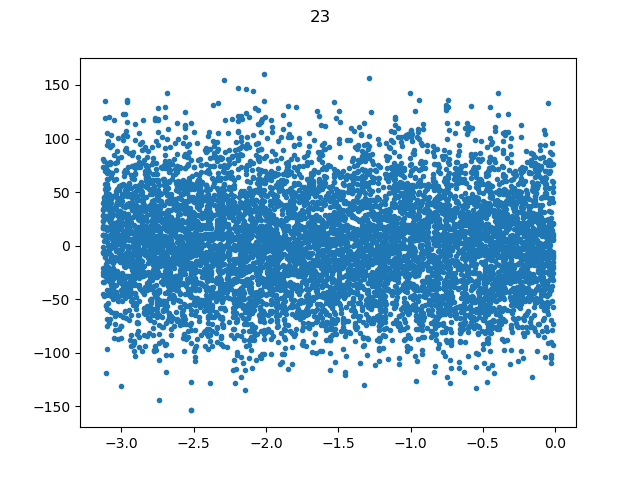

(16128,) (16128,)


<IPython.core.display.Javascript object>


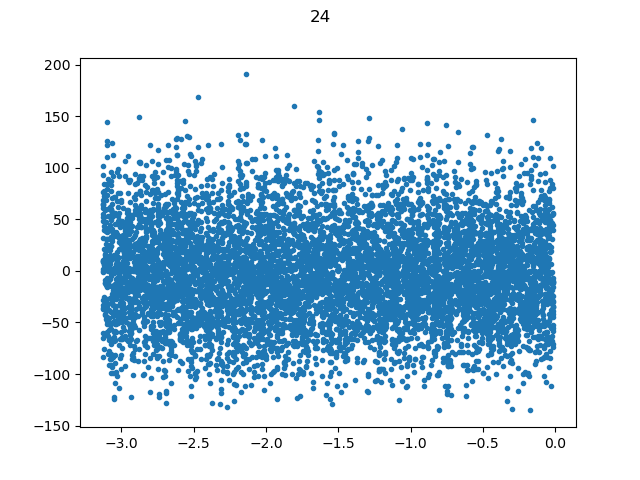

(16128,) (16128,)


<IPython.core.display.Javascript object>


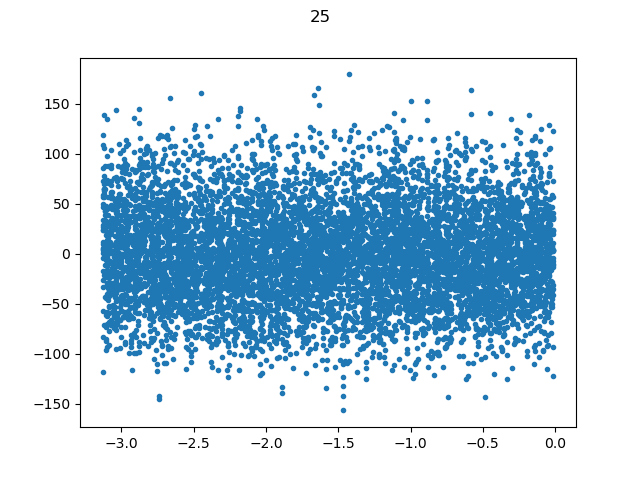

(16128,) (16128,)


In [67]:
pixels, angles = get_rad_pix(images_align, center_align, rad_inds, params.NradAzmBins, nanMap_align, [178, 179])
print(len(pixels), len(pixels[0]), pixels[0][0].shape)
print(len(angles), angles[0].shape)
for itm in range(len(pixels[0])):
    if itm < 15 or itm > 25:
        continue
    fig, ax = plt.subplots()
    fig.suptitle(str(itm))
    ang = np.array([angles[0] for x in range(pixels[0][itm].shape[0])]).flatten()
    print(ang.shape, pixels[0][itm].flatten().shape)
    ax.plot(ang, pixels[0][itm].flatten(), '.')
    time.sleep(0.2)
    

## 5.4 - 5.78

In [39]:
print(np.argmin(np.abs(q-5.4)), np.argmin(np.abs(q-5.78)))
print(np.argmin(np.abs(q-5.8)), np.argmin(np.abs(q-6.3)))
print(np.argmin(np.abs(q-6.3)), np.argmin(np.abs(q-6.62)))

157 168
168 183
183 192


<IPython.core.display.Javascript object>


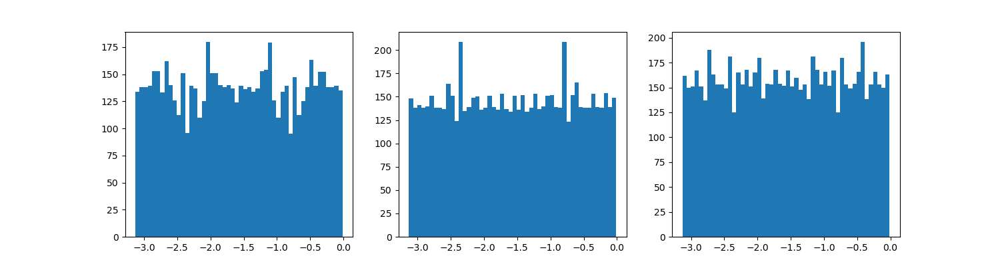

<IPython.core.display.Javascript object>


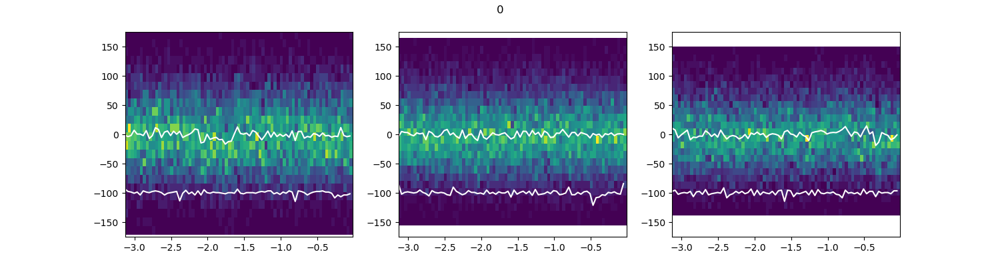

<IPython.core.display.Javascript object>


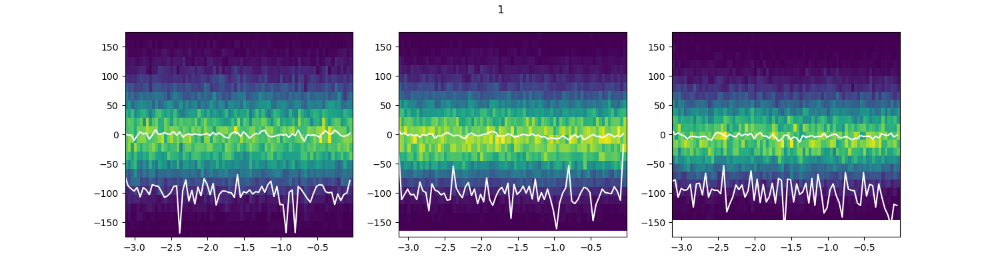

<IPython.core.display.Javascript object>


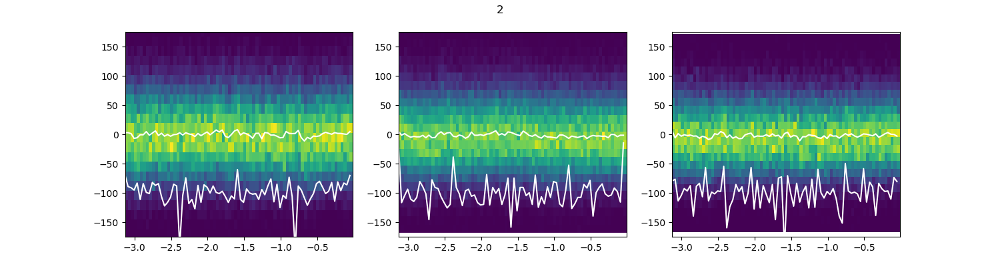

<IPython.core.display.Javascript object>


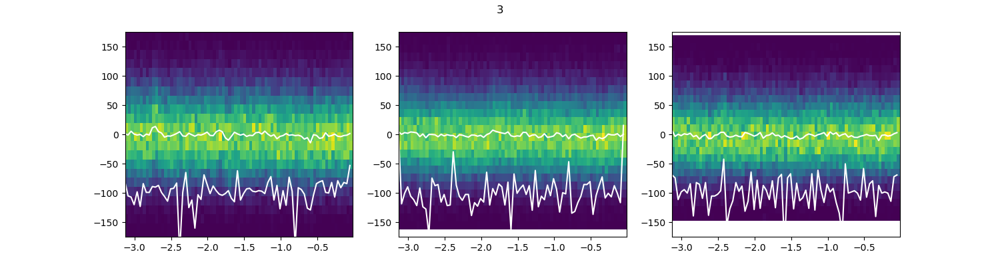

<IPython.core.display.Javascript object>


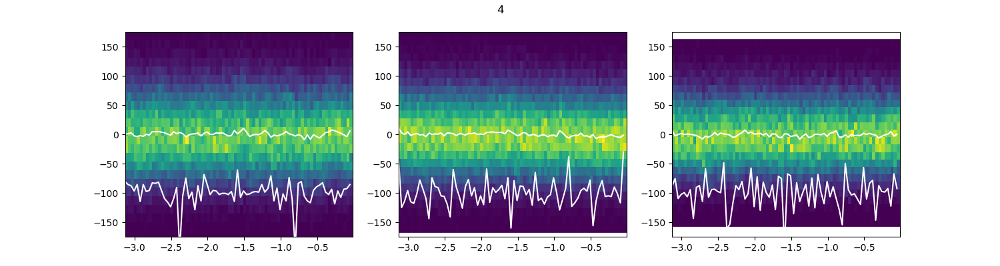

<IPython.core.display.Javascript object>


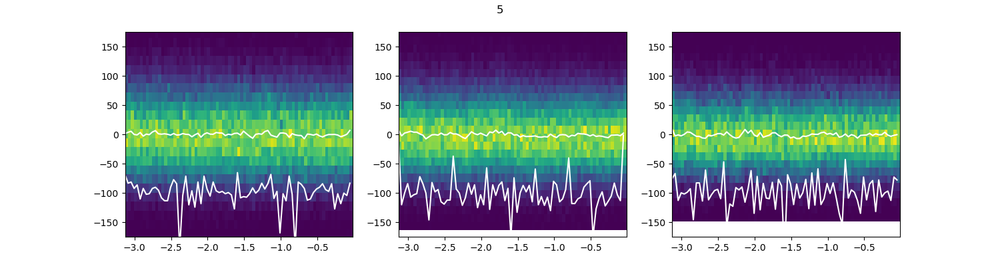

<IPython.core.display.Javascript object>


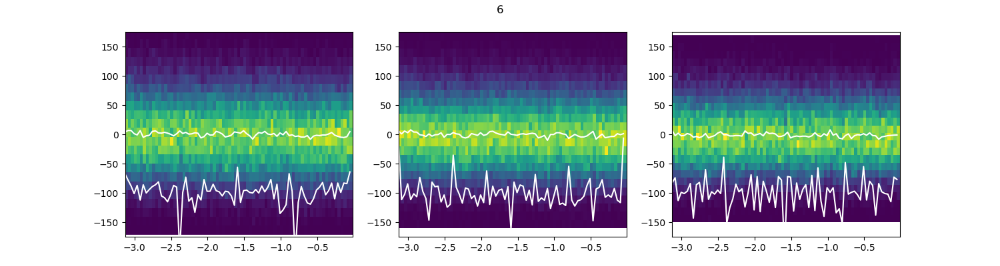

<IPython.core.display.Javascript object>


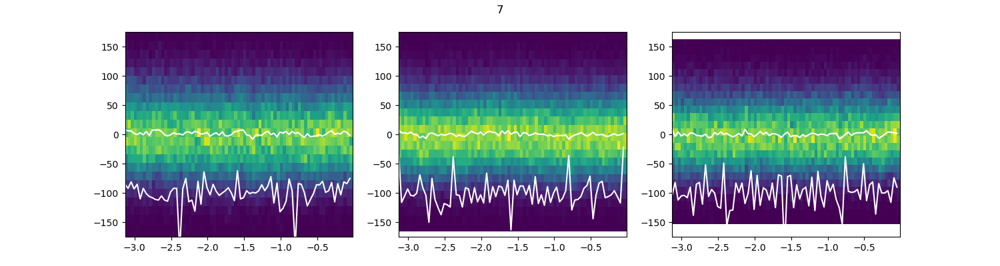

<IPython.core.display.Javascript object>


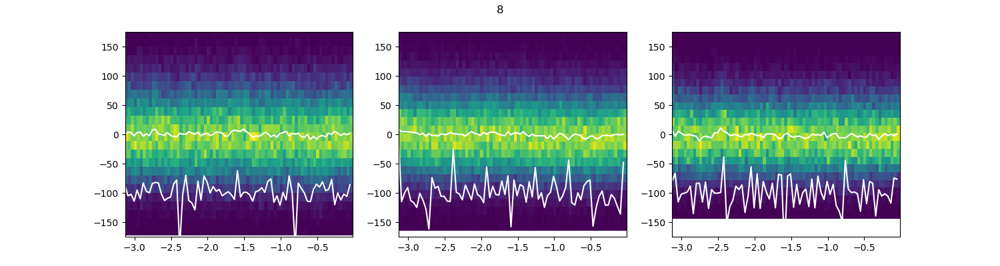

<IPython.core.display.Javascript object>


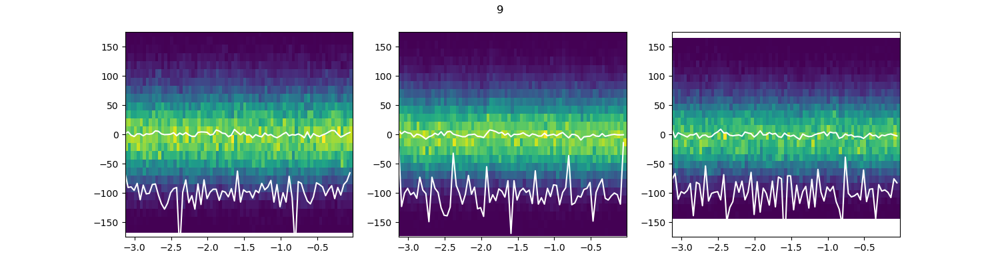

<IPython.core.display.Javascript object>


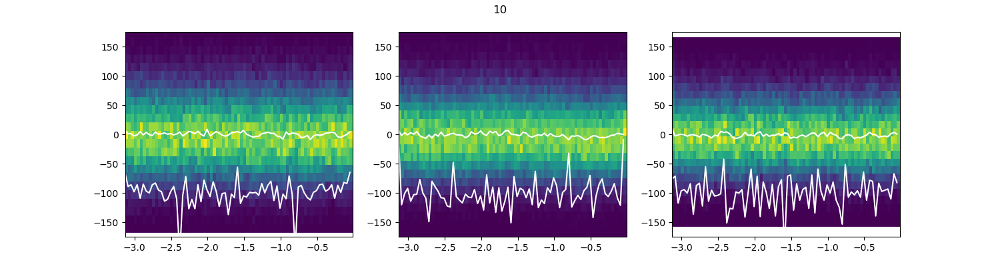

<IPython.core.display.Javascript object>


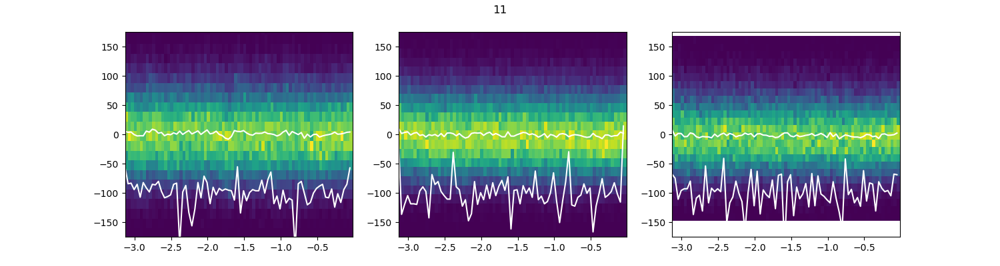

<IPython.core.display.Javascript object>


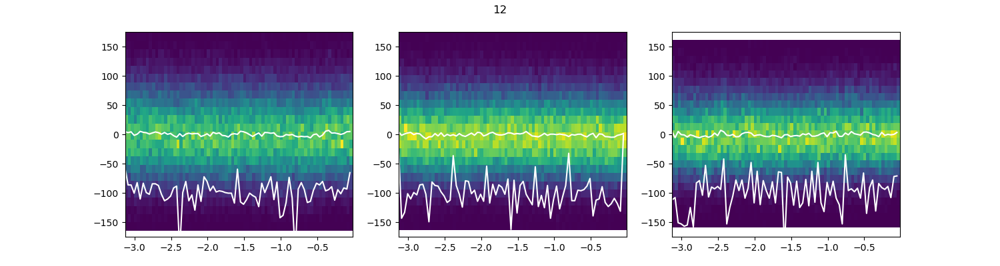

<IPython.core.display.Javascript object>


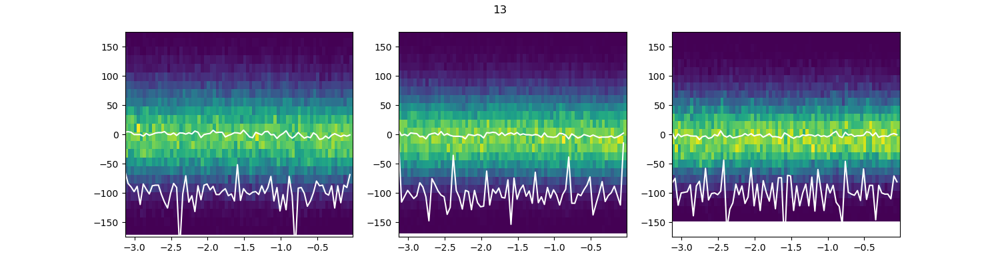

<IPython.core.display.Javascript object>


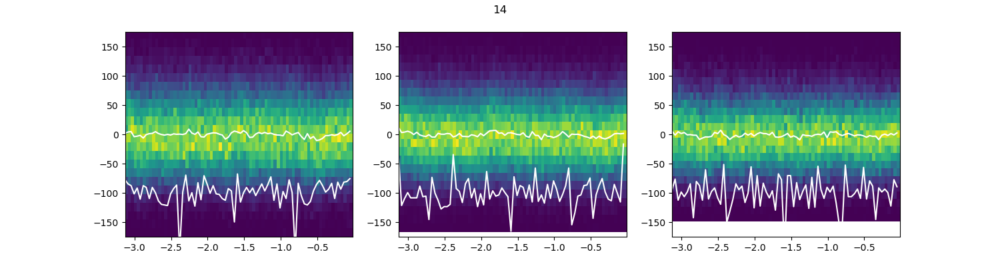

<IPython.core.display.Javascript object>


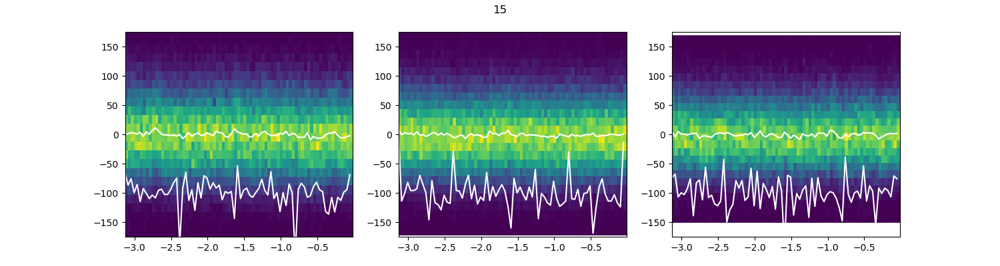

<IPython.core.display.Javascript object>


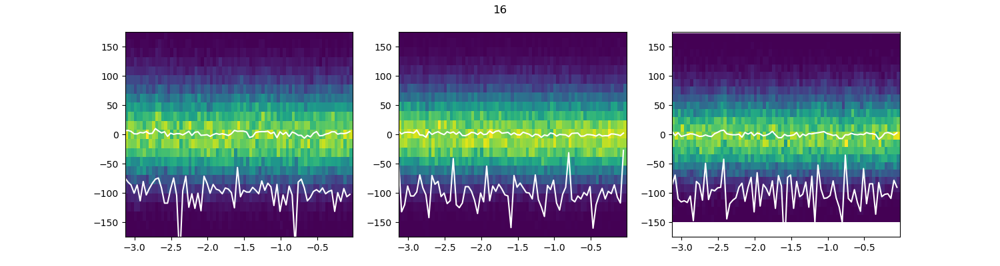

<IPython.core.display.Javascript object>


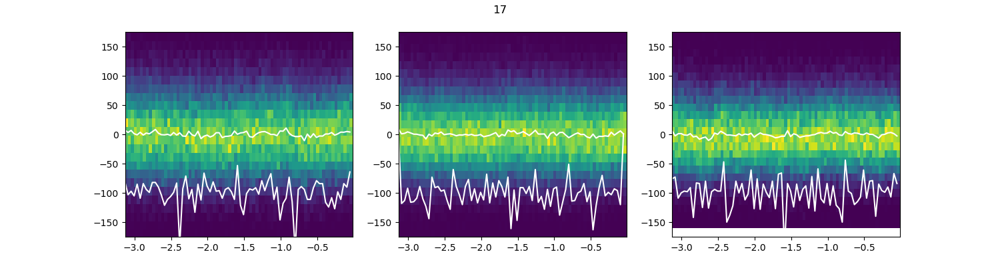

<IPython.core.display.Javascript object>


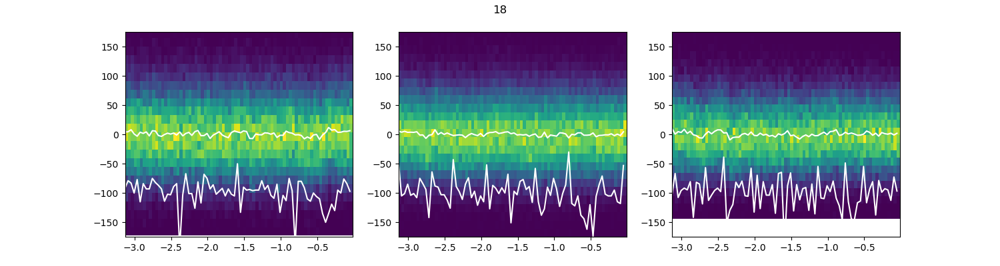

<IPython.core.display.Javascript object>


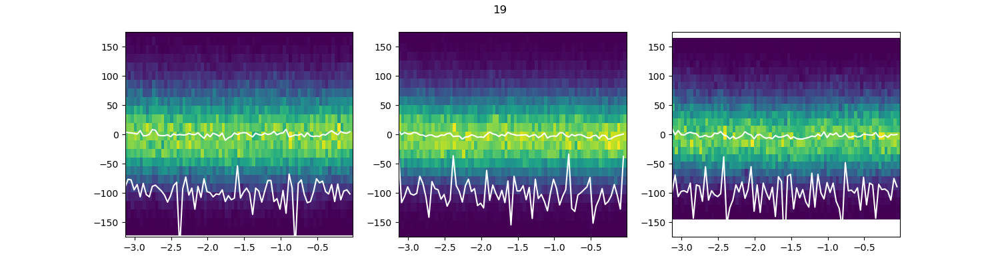

<IPython.core.display.Javascript object>


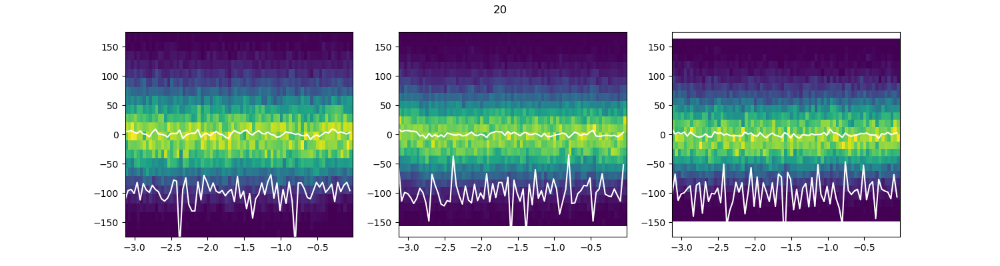

<IPython.core.display.Javascript object>


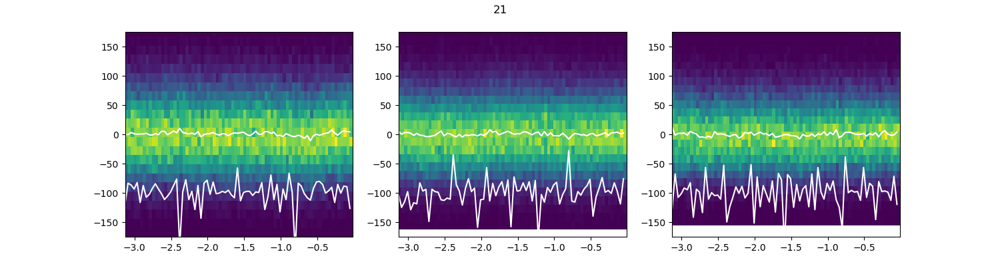

<IPython.core.display.Javascript object>


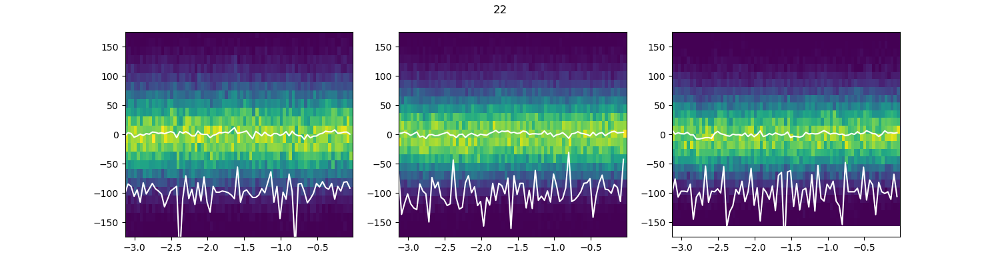

<IPython.core.display.Javascript object>


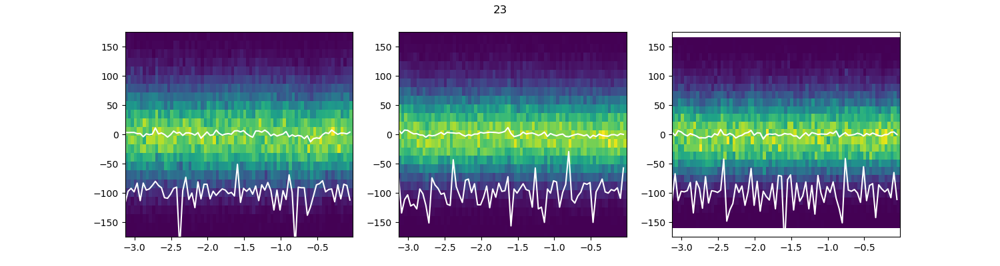

<IPython.core.display.Javascript object>


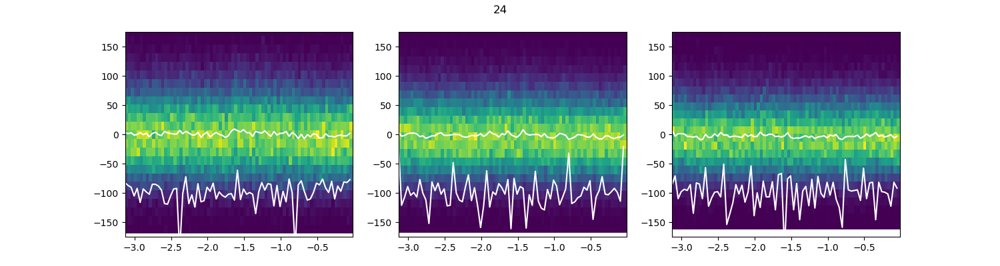

<IPython.core.display.Javascript object>


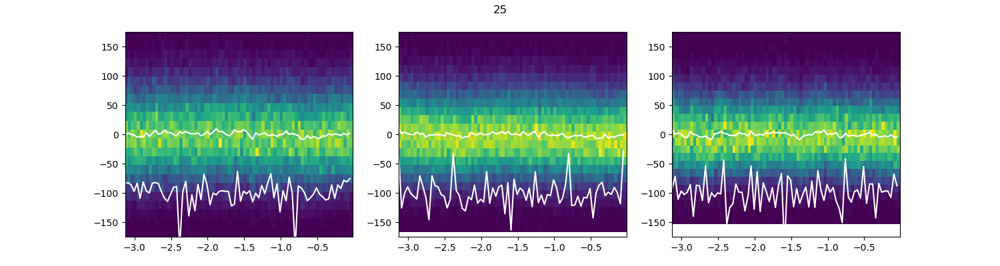

<IPython.core.display.Javascript object>


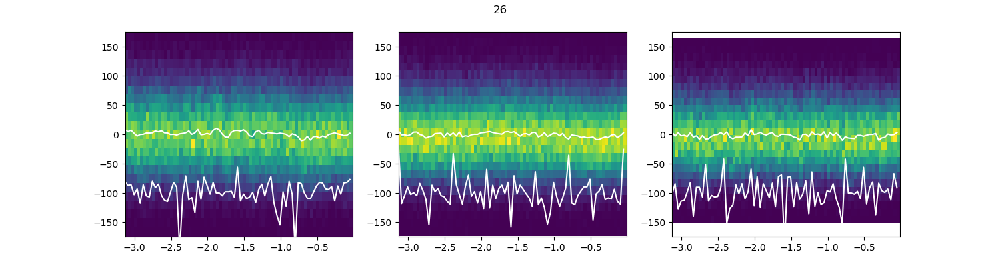

<IPython.core.display.Javascript object>


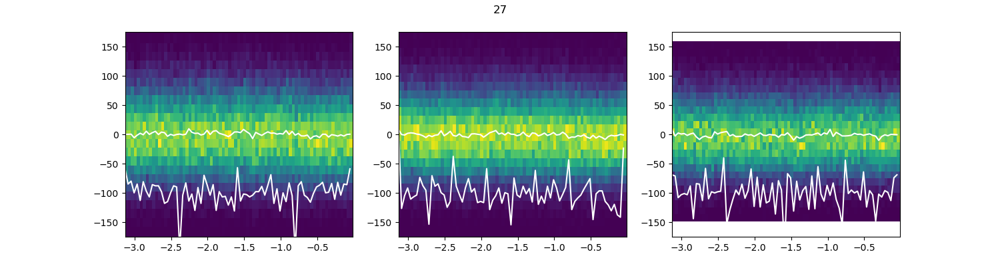

<IPython.core.display.Javascript object>


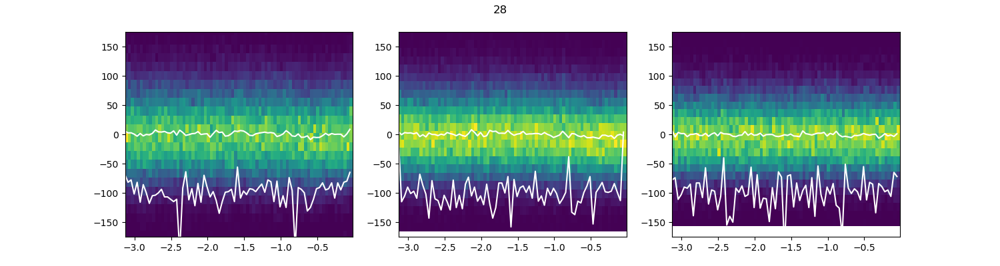

<IPython.core.display.Javascript object>


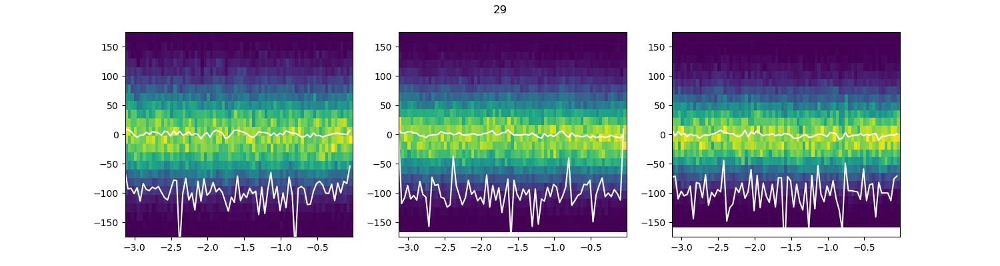

<IPython.core.display.Javascript object>


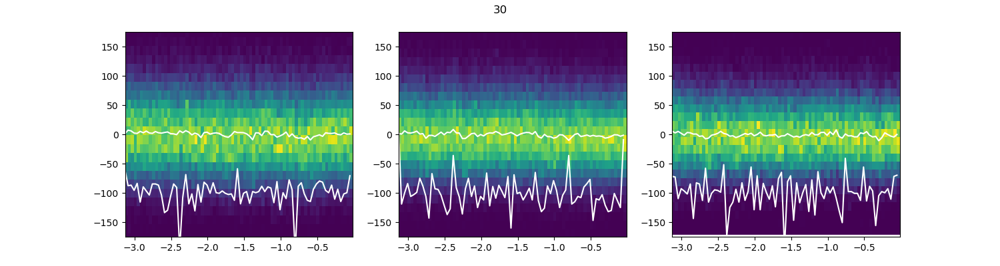

<IPython.core.display.Javascript object>


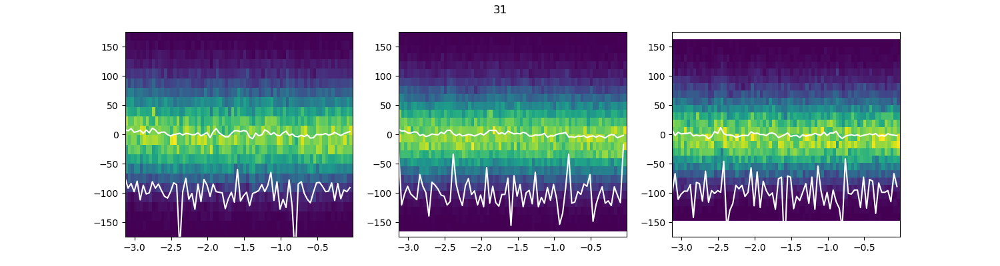

<IPython.core.display.Javascript object>


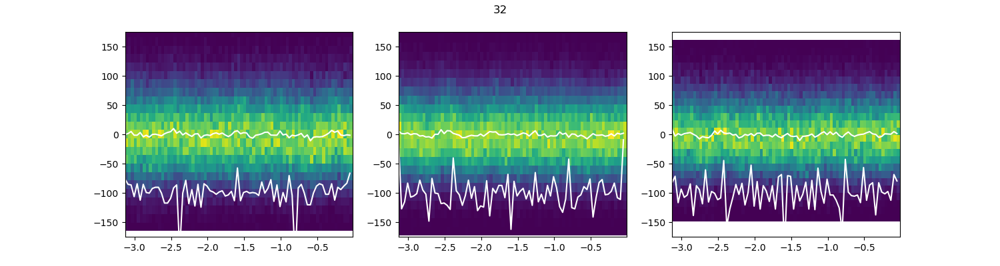

<IPython.core.display.Javascript object>


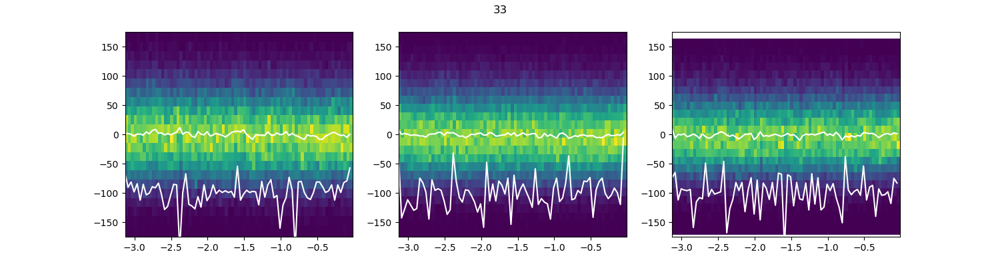

<IPython.core.display.Javascript object>


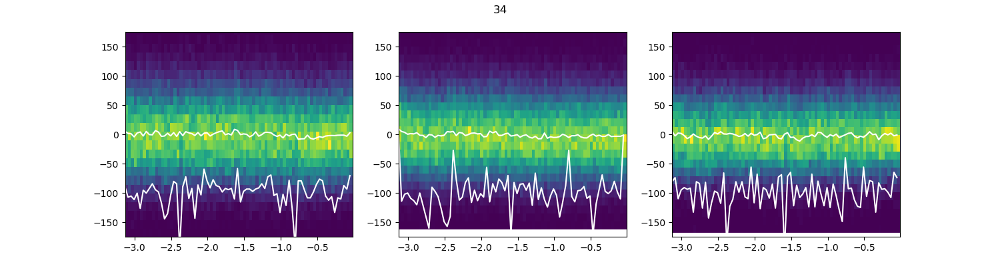

<IPython.core.display.Javascript object>


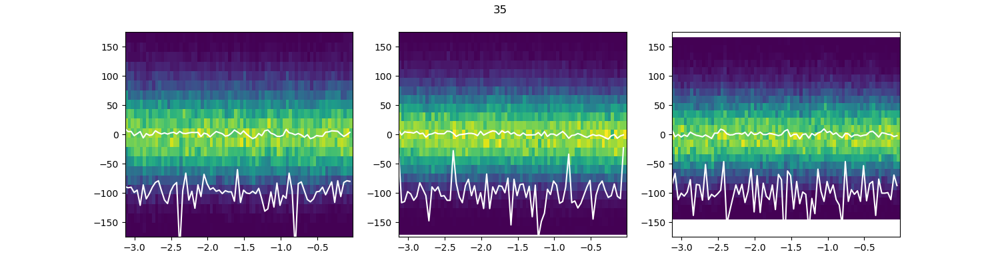

<IPython.core.display.Javascript object>


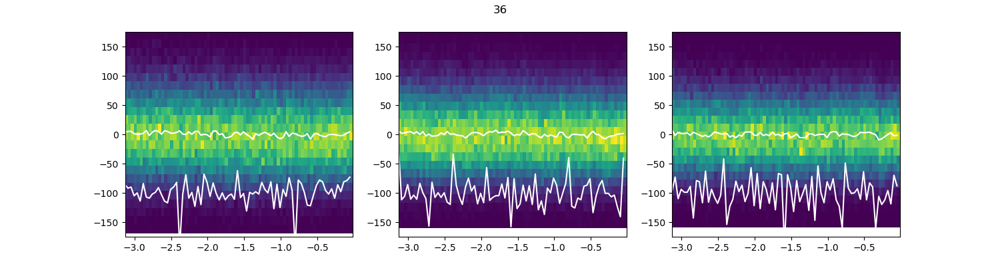

<IPython.core.display.Javascript object>


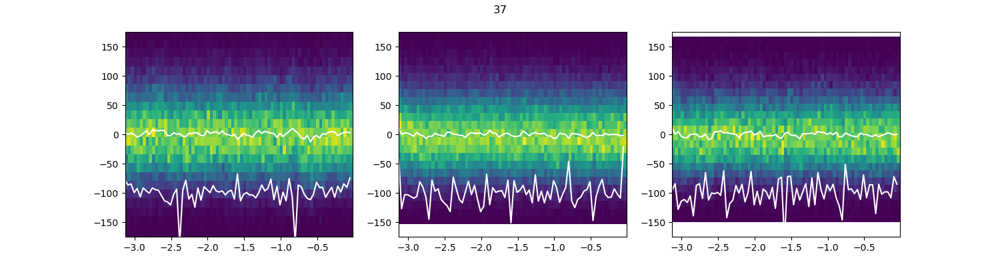

<IPython.core.display.Javascript object>


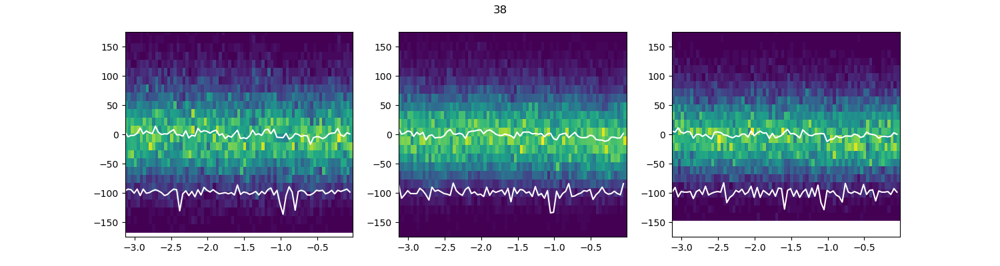

<IPython.core.display.Javascript object>


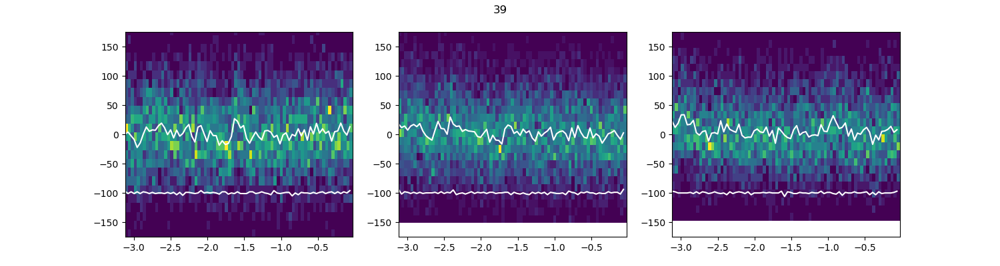

In [19]:
pixels0, angles0 = get_rad_pix(images_align, center_align, rad_inds, params.NradAzmBins, nanMap_align, [157, 168])
pixels1, angles1 = get_rad_pix(images_align, center_align, rad_inds, params.NradAzmBins, nanMap_align, [168, 183])
pixels2, angles2 = get_rad_pix(images_align, center_align, rad_inds, params.NradAzmBins, nanMap_align, [183, 192])

fig, ax = plt.subplots(1,3,figsize=(15,4))
ang = np.array([angles0[0] for x in range(pixels0[0][20].shape[0])]).flatten()
pix = pixels0[0][20].flatten()
mask = np.invert(np.isnan(pix))
ax[0].hist(ang[mask], 50)
ang = np.array([angles1[0] for x in range(pixels1[0][20].shape[0])]).flatten()
pix = pixels1[0][20].flatten()
mask = np.invert(np.isnan(pix))
ax[1].hist(ang[mask], 50)
ang = np.array([angles2[0] for x in range(pixels2[0][20].shape[0])]).flatten()
pix = pixels2[0][20].flatten()
mask = np.invert(np.isnan(pix))
ax[2].hist(ang[mask], 50)
for itm in range(len(pixels0[0])):
    #fig, ax = plt.subplots()
    #fig.suptitle(str(itm))
    #ang = np.array([angles[0] for x in range(pixels[0][itm].shape[0])]).flatten()
    #print(ang.shape, pixels[0][itm].flatten().shape)
    #ax.plot(ang, pixels[0][itm].flatten(), '.')
    #time.sleep(0.2)
    fig, ax = plt.subplots(1,3,figsize=(15,4))
    #ax.hist2d()
    fig.suptitle(str(itm))
    angs, pixs = [], []
    for ip in range(len(pixels0)):
        pix = pixels0[ip][itm].flatten()
        mask = np.invert(np.isnan(pix))
        angs.append(np.array([angles0[ip] for x in range(pixels0[ip][itm].shape[0])]).flatten()[mask])
        pixs.append(pix[mask])
    angs = np.concatenate(angs)
    pixs = np.concatenate(pixs)
    vals, x, y = np.histogram2d(angs, pixs, (75, 25))
    X, Y = np.meshgrid(x,y)
    ax[0].pcolormesh(X,Y,np.transpose(vals))
    mn = np.sum(vals, axis=1)
    ax[0].plot(x[:-1], mn - np.mean(mn) - 100, '-w')
    mn = np.sum(vals*np.expand_dims(y[1:]+y[:-1], 0)/2, axis=1)/np.sum(vals, axis=1)
    ax[0].plot(x[:-1], mn, '-w')
    ax[0].set_ylim([-175, 175])
    
    angs, pixs = [], []
    for ip in range(len(pixels1)):
        pix = pixels1[ip][itm].flatten()
        mask = np.invert(np.isnan(pix))
        angs.append(np.array([angles1[ip] for x in range(pixels1[ip][itm].shape[0])]).flatten()[mask])
        pixs.append(pix[mask])
    angs = np.concatenate(angs)
    pixs = np.concatenate(pixs)
    vals, x, y = np.histogram2d(angs, pixs, (75, 25))
    X, Y = np.meshgrid(x,y)
    ax[1].pcolormesh(X,Y,np.transpose(vals))
    mn = np.sum(vals, axis=1)
    ax[1].plot(x[:-1], mn - np.mean(mn) - 100, '-w')
    mn = np.sum(vals*np.expand_dims(y[1:]+y[:-1], 0)/2, axis=1)/np.sum(vals, axis=1)
    ax[1].plot(x[:-1], mn, '-w')
    ax[1].set_ylim([-175, 175])
    
    angs, pixs = [], []
    for ip in range(len(pixels2)):
        pix = pixels2[ip][itm].flatten()
        mask = np.invert(np.isnan(pix))
        angs.append(np.array([angles2[ip] for x in range(pixels2[ip][itm].shape[0])]).flatten()[mask])
        pixs.append(pix[mask])
    angs = np.concatenate(angs)
    pixs = np.concatenate(pixs)
    vals, x, y = np.histogram2d(angs, pixs, (75, 25))
    X, Y = np.meshgrid(x,y)
    ax[2].pcolormesh(X,Y,np.transpose(vals))
    mn = np.sum(vals, axis=1)
    ax[2].plot(x[:-1], mn - np.mean(mn) - 100, '-w')
    mn = np.sum(vals*np.expand_dims(y[1:]+y[:-1], 0)/2, axis=1)/np.sum(vals, axis=1)
    ax[2].plot(x[:-1], mn, '-w')
    ax[2].set_ylim([-175, 175])
    time.sleep(0.2)
    
    


In [ ]:
pixels, angles = get_rad_pix(images_align, center_align, rad_inds, params.NradAzmBins, nanMap_align, [157, 168])
for itm in range(len(pixels[0])):
    fig, ax = plt.subplots()
    fig.suptitle(str(itm))
    ang = np.array([angles[0] for x in range(pixels[0][itm].shape[0])]).flatten()
    print(ang.shape, pixels[0][itm].flatten().shape)
    ax.plot(ang, pixels[0][itm].flatten(), '.')
    time.sleep(0.2)